In [2]:
from google.colab import files
 
uploaded = files.upload()

Saving scaler_clustering.csv to scaler_clustering.csv


# **Scaler Clustering Problem**

# Problem Statement

Scaler is an online tech-versity offering intensive computer science & Data Science courses through live classes delivered by tech leaders and subject matter experts. The meticulously structured program enhances the skills of software professionals by offering a modern curriculum with exposure to the latest technologies. It is a product by InterviewBit.

You are working as a data scientist with the analytics vertical of Scaler, focused on profiling the best companies and job positions to work for from the Scaler database. You are provided with the information for a segment of learners and tasked to cluster them on the basis of their job profile, company, and other features. Ideally, these clusters should have similar characteristics.


# Column Profiling

   * ‘Unnamed 0’- Index of the dataset
   * Email_hash- Anonymised Personal Identifiable Information (PII)
   * Company_hash- Current employer of the learner
   * orgyear- Employment start date
   * CTC- Current CTC
   * Job_position- Job profile in the company
   * CTC_updated_year: Year in which CTC got updated (Yearly increments, Promotions)

In [3]:
# Analysis
#Importing Required Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
from datetime import datetime

import warnings
warnings.filterwarnings('ignore')

In [4]:
df=pd.read_csv('scaler_clustering.csv')
df.head()

,Unnamed: 0,company_hash,email_hash,orgyear,ctc,job_position,ctc_updated_year
0,0,atrgxnnt xzaxv,6de0a4417d18ab14334c3f43397fc13b30c35149d70c05...,2016.0,1100000,Other,2020.0
1,1,qtrxvzwt xzegwgbb rxbxnta,b0aaf1ac138b53cb6e039ba2c3d6604a250d02d5145c10...,2018.0,449999,FullStack Engineer,2019.0
2,2,ojzwnvwnxw vx,4860c670bcd48fb96c02a4b0ae3608ae6fdd98176112e9...,2015.0,2000000,Backend Engineer,2020.0
3,3,ngpgutaxv,effdede7a2e7c2af664c8a31d9346385016128d66bbc58...,2017.0,700000,Backend Engineer,2019.0
4,4,qxen sqghu,6ff54e709262f55cb999a1c1db8436cb2055d8f79ab520...,2017.0,1400000,FullStack Engineer,2019.0


In [5]:
df.shape

(205843, 7)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205843 entries, 0 to 205842
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        205843 non-null  int64  
 1   company_hash      205799 non-null  object 
 2   email_hash        205843 non-null  object 
 3   orgyear           205757 non-null  float64
 4   ctc               205843 non-null  int64  
 5   job_position      153281 non-null  object 
 6   ctc_updated_year  205843 non-null  float64
dtypes: float64(2), int64(2), object(3)
memory usage: 11.0+ MB


In [7]:
#calculating Total missing values
df.isnull().sum()

Unnamed: 0              0
company_hash           44
email_hash              0
orgyear                86
ctc                     0
job_position        52562
ctc_updated_year        0
dtype: int64

# Observations:
* There are some Missing Values
* Lets impute them with KNN Imputation

In [8]:
#Dropping Unnamed column which is not Required
df.drop(['Unnamed: 0'], axis=1, inplace=True)

In [9]:
# finding number of unique Hash mails
len(df.email_hash.unique())

153443

In [10]:
#Finding count of total emails in Dataset
df.email_hash.value_counts()

bbace3cc586400bbc65765bc6a16b77d8913836cfc98b77c05488f02f5714a4b    10
6842660273f70e9aa239026ba33bfe82275d6ab0d20124021b952b5bc3d07e6c     9
298528ce3160cc761e4dc37a07337ee2e0589df251d73645aae209b010210eee     9
3e5e49daa5527a6d5a33599b238bf9bf31e85b9efa9a94f1c88c5e15a6f31378     9
b4d5afa09bec8689017d8b29701b80d664ca37b83cb883376b2e95191320da66     8
                                                                    ..
bb2fe5e655ada7f7b7ac4a614db0b9c560e796bdfcaa4e5367e69eedfea93876     1
d6cdef97e759dbf1b7522babccbbbd5f164a75d1b4139e02c945958720f1ed79     1
700d1190c17aaa3f2dd9070e47a4c042ecd9205333545dbfaee0f85644d00306     1
c2a1c9e4b9f4e1ed7d889ee4560102c1e2235b2c1a0e59cea95a6fe55c658407     1
0bcfc1d05f2e8dc4147743a1313aa70a119b41b30d4a1f7e738a6a87d3712c31     1
Name: email_hash, Length: 153443, dtype: int64

In [11]:
#Finding Email present more than two single time in Dataset
df.email_hash.value_counts().loc[lambda x: x>1].index

Index(['bbace3cc586400bbc65765bc6a16b77d8913836cfc98b77c05488f02f5714a4b',
       '6842660273f70e9aa239026ba33bfe82275d6ab0d20124021b952b5bc3d07e6c',
       '298528ce3160cc761e4dc37a07337ee2e0589df251d73645aae209b010210eee',
       '3e5e49daa5527a6d5a33599b238bf9bf31e85b9efa9a94f1c88c5e15a6f31378',
       'b4d5afa09bec8689017d8b29701b80d664ca37b83cb883376b2e95191320da66',
       'faf40195f8c58d5c7edc758cc725a762d51920da996410b80ac4a4d85c803da0',
       '4818edfd67ed8563dde5d083306485d91d19f4f1c95d193a1700e79dd245b75c',
       'c0eb129061675da412b0deb15871dd06ef0d7cd86eb5f7e8cc6a20b0d1938183',
       'd598d6f1fb21b45593c2afc1c2f76ae9f4cb7167156cdf93246d4192a89d8065',
       'd15041f58bb01c8ee29f72e33b136e26bc32f3169a40b53d75fe7ae9cbb9a551',
       ...
       'fd08848591a84a2094b41687168637f8c3560af1e952912e78ef360ce2b49af2',
       'e95cb0c86c1ac7ec03bf2aefb4bcc112426dc7da2f3125101cfe19701e1c7342',
       'dc91571e48c0ba9f64b2e262c4bd7c65885f775a60888a76736cd0ef638175b8',
       '3e77e7

In [12]:
#Make Sure that orgyear is less than or equal to updated ctc year and making least year is 1993 considering age as 55
for i in range(len(df['orgyear'])):
    if df['orgyear'][i]>df['ctc_updated_year'][i]:
      df['orgyear'][i]=df['ctc_updated_year'][i]
    elif df['orgyear'][i]<=1993:
      df['orgyear'][i]=1993

In [14]:
#Remove special characters from the dataset(similar to Regex)
df['email_hash']=df.email_hash.str.replace('[^A-Za-z0-9 ]+', ' ')
df['company_hash']=df.company_hash.str.replace('[^A-Za-z0-9 ]+', ' ')
df['job_position']=df.job_position.str.replace('[^A-Za-z0-9 ]+', ' ')

In [15]:
# Dupluicate value check
if df.shape[0] == df.drop_duplicates().shape[0] :
    print('No duplicates Found')
else:
    duplicates = df.shape[0] - df.drop_duplicates().shape[0]
    print('{} duplicates found'.format(duplicates))

37 duplicates found


In [16]:
#Dropping Duplicates 
df=df.drop_duplicates(keep='last', inplace=False,ignore_index=True)
df

,company_hash,email_hash,orgyear,ctc,job_position,ctc_updated_year
0,atrgxnnt xzaxv,6de0a4417d18ab14334c3f43397fc13b30c35149d70c05...,2016.0,1100000,Other,2020.0
1,qtrxvzwt xzegwgbb rxbxnta,b0aaf1ac138b53cb6e039ba2c3d6604a250d02d5145c10...,2018.0,449999,FullStack Engineer,2019.0
2,ojzwnvwnxw vx,4860c670bcd48fb96c02a4b0ae3608ae6fdd98176112e9...,2015.0,2000000,Backend Engineer,2020.0
3,ngpgutaxv,effdede7a2e7c2af664c8a31d9346385016128d66bbc58...,2017.0,700000,Backend Engineer,2019.0
4,qxen sqghu,6ff54e709262f55cb999a1c1db8436cb2055d8f79ab520...,2017.0,1400000,FullStack Engineer,2019.0
...,...,...,...,...,...,...
205801,vuurt xzw,70027b728c8ee901fe979533ed94ffda97be08fc23f33b...,2008.0,220000,NaN,2019.0
205802,husqvawgb,7f7292ffad724ebbe9ca860f515245368d714c84705b42...,2017.0,500000,NaN,2020.0
205803,vwwgrxnt,cb25cc7304e9a24facda7f5567c7922ffc48e3d5d6018c...,2021.0,700000,NaN,2021.0
205804,zgn vuurxwvmrt,fb46a1a2752f5f652ce634f6178d0578ef6995ee59f6c8...,2019.0,5100000,NaN,2019.0


# KNN IMPUTATION

In [17]:
_data_nums=df.select_dtypes(np.number)

In [18]:
_data_nums

,orgyear,ctc,ctc_updated_year
0,2016.0,1100000,2020.0
1,2018.0,449999,2019.0
2,2015.0,2000000,2020.0
3,2017.0,700000,2019.0
4,2017.0,1400000,2019.0
...,...,...,...
205801,2008.0,220000,2019.0
205802,2017.0,500000,2020.0
205803,2021.0,700000,2021.0
205804,2019.0,5100000,2019.0


In [19]:
_data_nums.isnull().sum()

orgyear             86
ctc                  0
ctc_updated_year     0
dtype: int64

In [20]:
columns=_data_nums.columns

In [21]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean',)
imputer.fit(_data_nums)
# transform the dataset
_data_new = imputer.transform(_data_nums)

In [23]:
_data_new=pd.DataFrame(_data_new)
_data_new

,0,1,2
0,2016.0,1100000.0,2020.0
1,2018.0,449999.0,2019.0
2,2015.0,2000000.0,2020.0
3,2017.0,700000.0,2019.0
4,2017.0,1400000.0,2019.0
...,...,...,...
205801,2008.0,220000.0,2019.0
205802,2017.0,500000.0,2020.0
205803,2021.0,700000.0,2021.0
205804,2019.0,5100000.0,2019.0


In [24]:
_data_new.columns=columns

In [25]:
_data_new.isnull().sum()

orgyear             0
ctc                 0
ctc_updated_year    0
dtype: int64

In [26]:
df['orgyear']=_data_new['orgyear']

In [27]:
df.isnull().sum()

company_hash           44
email_hash              0
orgyear                 0
ctc                     0
job_position        52545
ctc_updated_year        0
dtype: int64

# Feature Engineering

In [28]:
# CurrentYear=2023
df['Years_of_Experience']=2023-df['orgyear']

In [30]:
df = df.reindex(columns=['company_hash','email_hash','job_position','ctc','orgyear','ctc_updated_year','Years_of_Experience'])
df

,company_hash,email_hash,job_position,ctc,orgyear,ctc_updated_year,Years_of_Experience
0,atrgxnnt xzaxv,6de0a4417d18ab14334c3f43397fc13b30c35149d70c05...,Other,1100000,2016.0,2020.0,7.0
1,qtrxvzwt xzegwgbb rxbxnta,b0aaf1ac138b53cb6e039ba2c3d6604a250d02d5145c10...,FullStack Engineer,449999,2018.0,2019.0,5.0
2,ojzwnvwnxw vx,4860c670bcd48fb96c02a4b0ae3608ae6fdd98176112e9...,Backend Engineer,2000000,2015.0,2020.0,8.0
3,ngpgutaxv,effdede7a2e7c2af664c8a31d9346385016128d66bbc58...,Backend Engineer,700000,2017.0,2019.0,6.0
4,qxen sqghu,6ff54e709262f55cb999a1c1db8436cb2055d8f79ab520...,FullStack Engineer,1400000,2017.0,2019.0,6.0
...,...,...,...,...,...,...,...
205801,vuurt xzw,70027b728c8ee901fe979533ed94ffda97be08fc23f33b...,NaN,220000,2008.0,2019.0,15.0
205802,husqvawgb,7f7292ffad724ebbe9ca860f515245368d714c84705b42...,NaN,500000,2017.0,2020.0,6.0
205803,vwwgrxnt,cb25cc7304e9a24facda7f5567c7922ffc48e3d5d6018c...,NaN,700000,2021.0,2021.0,2.0
205804,zgn vuurxwvmrt,fb46a1a2752f5f652ce634f6178d0578ef6995ee59f6c8...,NaN,5100000,2019.0,2019.0,4.0


In [31]:
#Filling Missing Values in Job_position by grouping and making buckets and later imputing them
from scipy import stats as st
df_mode=df.groupby(['email_hash','company_hash','Years_of_Experience']).agg({'job_position':lambda x:st.mode(x)[0],'ctc':'last',
                                                                             'orgyear':'first','ctc_updated_year':'last'})
df_mode

,,,job_position,ctc,orgyear,ctc_updated_year
email_hash,company_hash,Years_of_Experience,,,,
00003288036a44374976948c327f246fdbdf077854690475243a9c91d3b1cf9f,bxwqgogen,11.0,Backend Engineer,3500000,2012.0,2019.0
0000aaa0e6b61f7636af1954b43d294484cd151c9b3cf6a761391159aa77f3fa,nqsn axsxnvr,10.0,Backend Engineer,250000,2013.0,2020.0
0000d58fbc18012bf6fa2605a7b0357d126ee69bc41032ace6b6223c48468887,gunhb,4.0,NaN,1300000,2019.0,2019.0
000120d0c8aa304fcf12ab4b85e21feb80a342cfea03d461a50a3e16626a4177,bxwqgotbx wgqugqvnxgz,19.0,FullStack Engineer,2000000,2004.0,2021.0
00014d71a389170e668ba96ae8e1f9d991591acc8990253cc62a371eea92155b,fvrbvqn rvmo,14.0,NaN,3400000,2009.0,2018.0
...,...,...,...,...,...,...
fffc254e627e4bd1bc0ed7f01f9aebbba7c3cc56ac914ebadddd76333a7855fc,tqxwoogz ogenfvqt wvbuho,19.0,QA Engineer,3529999,2004.0,2019.0
fffcf97db1e9c13898f4eb4cd1c2fe862358480e104535a548f1b9daf660771c,trnqvcg,8.0,NaN,1600000,2015.0,2018.0
fffe7552892f8ca5fb8647d49ca805b72ea0e9538b6b015e59d649b349641174,znn avnv srgmvr atrxctqj otqcxwto,9.0,Devops Engineer,900000,2014.0,2019.0


In [32]:
df_mode=df_mode.reset_index()

In [33]:
df_mode.sort_values(by=['email_hash','company_hash','Years_of_Experience'], inplace=True,ascending=False)
df_mode

,email_hash,company_hash,Years_of_Experience,job_position,ctc,orgyear,ctc_updated_year
160843,ffffa3eb3575f43b86d986911463dce7bcadcea227e5a4...,sgrabvz ovwyo,5.0,FullStack Engineer,1500000,2018.0,2021.0
160842,ffff49f963e4493d8bbc7cc15365423d84a767259f7200...,zwq wgqugqvnxgz,3.0,FullStack Engineer,700000,2020.0,2020.0
160841,fffe7552892f8ca5fb8647d49ca805b72ea0e9538b6b01...,znn avnv srgmvr atrxctqj otqcxwto,9.0,Devops Engineer,900000,2014.0,2019.0
160840,fffcf97db1e9c13898f4eb4cd1c2fe862358480e104535...,trnqvcg,8.0,NaN,1600000,2015.0,2018.0
160839,fffc254e627e4bd1bc0ed7f01f9aebbba7c3cc56ac914e...,tqxwoogz ogenfvqt wvbuho,19.0,QA Engineer,3529999,2004.0,2019.0
...,...,...,...,...,...,...,...
4,00014d71a389170e668ba96ae8e1f9d991591acc899025...,fvrbvqn rvmo,14.0,NaN,3400000,2009.0,2018.0
3,000120d0c8aa304fcf12ab4b85e21feb80a342cfea03d4...,bxwqgotbx wgqugqvnxgz,19.0,FullStack Engineer,2000000,2004.0,2021.0
2,0000d58fbc18012bf6fa2605a7b0357d126ee69bc41032...,gunhb,4.0,NaN,1300000,2019.0,2019.0
1,0000aaa0e6b61f7636af1954b43d294484cd151c9b3cf6...,nqsn axsxnvr,10.0,Backend Engineer,250000,2013.0,2020.0


In [34]:
df_mode.ffill(axis = 0,inplace=True)
df_mode

,email_hash,company_hash,Years_of_Experience,job_position,ctc,orgyear,ctc_updated_year
160843,ffffa3eb3575f43b86d986911463dce7bcadcea227e5a4...,sgrabvz ovwyo,5.0,FullStack Engineer,1500000,2018.0,2021.0
160842,ffff49f963e4493d8bbc7cc15365423d84a767259f7200...,zwq wgqugqvnxgz,3.0,FullStack Engineer,700000,2020.0,2020.0
160841,fffe7552892f8ca5fb8647d49ca805b72ea0e9538b6b01...,znn avnv srgmvr atrxctqj otqcxwto,9.0,Devops Engineer,900000,2014.0,2019.0
160840,fffcf97db1e9c13898f4eb4cd1c2fe862358480e104535...,trnqvcg,8.0,Devops Engineer,1600000,2015.0,2018.0
160839,fffc254e627e4bd1bc0ed7f01f9aebbba7c3cc56ac914e...,tqxwoogz ogenfvqt wvbuho,19.0,QA Engineer,3529999,2004.0,2019.0
...,...,...,...,...,...,...,...
4,00014d71a389170e668ba96ae8e1f9d991591acc899025...,fvrbvqn rvmo,14.0,Database Administrator,3400000,2009.0,2018.0
3,000120d0c8aa304fcf12ab4b85e21feb80a342cfea03d4...,bxwqgotbx wgqugqvnxgz,19.0,FullStack Engineer,2000000,2004.0,2021.0
2,0000d58fbc18012bf6fa2605a7b0357d126ee69bc41032...,gunhb,4.0,FullStack Engineer,1300000,2019.0,2019.0
1,0000aaa0e6b61f7636af1954b43d294484cd151c9b3cf6...,nqsn axsxnvr,10.0,Backend Engineer,250000,2013.0,2020.0


In [36]:
#checking for null values
df_mode.isnull().sum()

email_hash             0
company_hash           0
Years_of_Experience    0
job_position           0
ctc                    0
orgyear                0
ctc_updated_year       0
dtype: int64

# Observations:
 * NO Missing Values are present.
 * Can proceed for Manual CLustering.

# Manual Clustering

**Creating Designation Flag**

creating some flags showing learners with CTC greater than the Average of their Company’s department(same job position) having same Years of Experience

In [37]:
df_designation=df_mode.groupby(['company_hash','job_position','Years_of_Experience'])['ctc'].describe()
df_designation

count  \
company_hash                   job_position       Years_of_Experience          
0                              Data Scientist     3.0                    1.0   
0000                           Other              6.0                    1.0   
01 ojztqsj                     Android Engineer   7.0                    1.0   
                               Frontend Engineer  12.0                   1.0   
05mz exzytvrny uqxcvnt rxbxnta FullStack Engineer 4.0                    1.0   
...                                                                      ...   
zz                             Other              10.0                   1.0   
                                                  14.0                   1.0   
zzb ztdnstz vacxogqj ucn rna   FullStack Engineer 6.0                    1.0   
zzgato                         Other              9.0                    1.0   
zzzbzb                         Other              30.0                   1.0   

                                                                            mean  \
company_hash                   job_position       Years_of_Experience              
0                              Data Scientist     3.0                   100000.0   
0000                           Other              6.0                   300000.0   
01 ojztqsj                     Android Engineer   7.0                   270000.0   
                               Frontend Engineer  12.0                  830000.0   
05mz exzytvrny uqxcvnt rxbxnta FullStack Engineer 4.0                  1100000.0   
...                                                                          ...   
zz                             Other              10.0                 1370000.0   
                                                  14.0                  500000.0   
zzb ztdnstz vacxogqj ucn rna   FullStack Engineer 6.0                   600000.0   
zzgato                         Other              9.0                   130000.0   
zzzbzb                         Other              30.0                  720000.0   

                                                                       std  \
company_hash                   job_position       Years_of_Experience        
0                              Data Scientist     3.0                  NaN   
0000                           Other              6.0                  NaN   
01 ojztqsj                     Android Engineer   7.0                  NaN   
                               Frontend Engineer  12.0                 NaN   
05mz exzytvrny uqxcvnt rxbxnta FullStack Engineer 4.0                  NaN   
...                                                                    ...   
zz                             Other              10.0                 NaN   
                                                  14.0                 NaN   
zzb ztdnstz vacxogqj ucn rna   FullStack Engineer 6.0                  NaN   
zzgato                         Other              9.0                  NaN   
zzzbzb                         Other              30.0                 NaN   

                                                                             min  \
company_hash                   job_position       Years_of_Experience              
0                              Data Scientist     3.0                   100000.0   
0000                           Other              6.0                   300000.0   
01 ojztqsj                     Android Engineer   7.0                   270000.0   
                               Frontend Engineer  12.0                  830000.0   
05mz exzytvrny uqxcvnt rxbxnta FullStack Engineer 4.0                  1100000.0   
...                                                                          ...   
zz                             Other              10.0                 1370000.0   
                                                  14.0                  500000.0   
zzb ztdnstz vacxogqj ucn rna   FullStack Engineer 6.0                   600000.0  

In [38]:
df_designation=df_designation.reset_index()

In [39]:
df_designation=df_designation[['company_hash','job_position','Years_of_Experience','25%','75%']]
df_designation

,company_hash,job_position,Years_of_Experience,25%,75%
0,0,Data Scientist,3.0,100000.0,100000.0
1,0000,Other,6.0,300000.0,300000.0
2,01 ojztqsj,Android Engineer,7.0,270000.0,270000.0
3,01 ojztqsj,Frontend Engineer,12.0,830000.0,830000.0
4,05mz exzytvrny uqxcvnt rxbxnta,FullStack Engineer,4.0,1100000.0,1100000.0
...,...,...,...,...,...
99657,zz,Other,10.0,1370000.0,1370000.0
99658,zz,Other,14.0,500000.0,500000.0
99659,zzb ztdnstz vacxogqj ucn rna,FullStack Engineer,6.0,600000.0,600000.0
99660,zzgato,Other,9.0,130000.0,130000.0


In [40]:
df_new=pd.merge(df_mode,df_designation,how='left')
df_new

,email_hash,company_hash,Years_of_Experience,job_position,ctc,orgyear,ctc_updated_year,25%,75%
0,ffffa3eb3575f43b86d986911463dce7bcadcea227e5a4...,sgrabvz ovwyo,5.0,FullStack Engineer,1500000,2018.0,2021.0,2200000.0,3100000.0
1,ffff49f963e4493d8bbc7cc15365423d84a767259f7200...,zwq wgqugqvnxgz,3.0,FullStack Engineer,700000,2020.0,2020.0,700000.0,840000.0
2,fffe7552892f8ca5fb8647d49ca805b72ea0e9538b6b01...,znn avnv srgmvr atrxctqj otqcxwto,9.0,Devops Engineer,900000,2014.0,2019.0,625000.0,775000.0
3,fffcf97db1e9c13898f4eb4cd1c2fe862358480e104535...,trnqvcg,8.0,Devops Engineer,1600000,2015.0,2018.0,1600000.0,1600000.0
4,fffc254e627e4bd1bc0ed7f01f9aebbba7c3cc56ac914e...,tqxwoogz ogenfvqt wvbuho,19.0,QA Engineer,3529999,2004.0,2019.0,3529999.0,3529999.0
...,...,...,...,...,...,...,...,...,...
160839,00014d71a389170e668ba96ae8e1f9d991591acc899025...,fvrbvqn rvmo,14.0,Database Administrator,3400000,2009.0,2018.0,3400000.0,3400000.0
160840,000120d0c8aa304fcf12ab4b85e21feb80a342cfea03d4...,bxwqgotbx wgqugqvnxgz,19.0,FullStack Engineer,2000000,2004.0,2021.0,2000000.0,2000000.0
160841,0000d58fbc18012bf6fa2605a7b0357d126ee69bc41032...,gunhb,4.0,FullStack Engineer,1300000,2019.0,2019.0,707500.0,1300000.0
160842,0000aaa0e6b61f7636af1954b43d294484cd151c9b3cf6...,nqsn axsxnvr,10.0,Backend Engineer,250000,2013.0,2020.0,250000.0,250000.0


In [41]:
#Creating Designation_Flag(initialising with Zero)
df_new['Designation_Flag']=0
df_new.columns = df_new.columns.str.replace("25%", "Designation_Q1")
df_new.columns = df_new.columns.str.replace("75%", "Designation_Q3")

In [43]:
#Calculating flags based on Designation Quartiles formed during Groupby
for i in range(len(df_new['Designation_Flag'])):
  if int(df_new['ctc'][i])<=int(df_new['Designation_Q1'][i]):
    df_new['Designation_Flag'][i]=3
  elif int(df_new['ctc'][i])>=int(df_new['Designation_Q3'][i]):
    df_new['Designation_Flag'][i]=1
  else:
    df_new['Designation_Flag'][i]=2

In [44]:
df_new['Designation_Flag'].value_counts()

3    111551
1     26077
2     23216
Name: Designation_Flag, dtype: int64

**Creating Class Flag**

creating some flags showing learners with CTC greater than the Average of their Company’s department having same Job Position

In [46]:
df_class=df_mode.groupby(['company_hash','job_position'])['ctc'].describe()
df_class.tail(10)

,,count,mean,std,min,25%,50%,75%,max
company_hash,job_position,,,,,,,,
zxzvnxgzvr xzonqhbtzno,Devops Engineer,1.0,650000.0,NaN,650000.0,650000.0,650000.0,650000.0,650000.0
zxzvzxjv sqghu,Engineering Leadership,1.0,1180000.0,NaN,1180000.0,1180000.0,1180000.0,1180000.0,1180000.0
zyco xzaxv,Other,1.0,500000.0,NaN,500000.0,500000.0,500000.0,500000.0,500000.0
zyuw rxbxnta,Frontend Engineer,1.0,2400000.0,NaN,2400000.0,2400000.0,2400000.0,2400000.0,2400000.0
zyvzwt fgga qtztfvr eqvzwyxogq yi,Backend Engineer,1.0,900000.0,NaN,900000.0,900000.0,900000.0,900000.0,900000.0
zyvzwt wgzohrnxzs tzsxzttqo,Frontend Engineer,1.0,940000.0,NaN,940000.0,940000.0,940000.0,940000.0,940000.0
zz,Other,2.0,935000.0,615182.899632,500000.0,717500.0,935000.0,1152500.0,1370000.0
zzb ztdnstz vacxogqj ucn rna,FullStack Engineer,1.0,600000.0,NaN,600000.0,600000.0,600000.0,600000.0,600000.0
zzgato,Other,1.0,130000.0,NaN,130000.0,130000.0,130000.0,130000.0,130000.0


In [47]:
df_class=df_class.reset_index()

In [48]:
df_class=df_class[['company_hash','job_position','25%','75%']]
df_class

,company_hash,job_position,25%,75%
0,0,Data Scientist,100000.0,100000.0
1,0000,Other,300000.0,300000.0
2,01 ojztqsj,Android Engineer,270000.0,270000.0
3,01 ojztqsj,Frontend Engineer,830000.0,830000.0
4,05mz exzytvrny uqxcvnt rxbxnta,FullStack Engineer,1100000.0,1100000.0
...,...,...,...,...
63730,zyvzwt wgzohrnxzs tzsxzttqo,Frontend Engineer,940000.0,940000.0
63731,zz,Other,717500.0,1152500.0
63732,zzb ztdnstz vacxogqj ucn rna,FullStack Engineer,600000.0,600000.0
63733,zzgato,Other,130000.0,130000.0


In [49]:
df_new=pd.merge(df_new,df_class,how='left')
df_new

,email_hash,company_hash,Years_of_Experience,job_position,ctc,orgyear,ctc_updated_year,Designation_Q1,Designation_Q3,Designation_Flag,25%,75%
0,ffffa3eb3575f43b86d986911463dce7bcadcea227e5a4...,sgrabvz ovwyo,5.0,FullStack Engineer,1500000,2018.0,2021.0,2200000.0,3100000.0,3,1837500.0,3255000.0
1,ffff49f963e4493d8bbc7cc15365423d84a767259f7200...,zwq wgqugqvnxgz,3.0,FullStack Engineer,700000,2020.0,2020.0,700000.0,840000.0,3,700000.0,1325000.0
2,fffe7552892f8ca5fb8647d49ca805b72ea0e9538b6b01...,znn avnv srgmvr atrxctqj otqcxwto,9.0,Devops Engineer,900000,2014.0,2019.0,625000.0,775000.0,1,680000.0,900000.0
3,fffcf97db1e9c13898f4eb4cd1c2fe862358480e104535...,trnqvcg,8.0,Devops Engineer,1600000,2015.0,2018.0,1600000.0,1600000.0,3,1600000.0,1600000.0
4,fffc254e627e4bd1bc0ed7f01f9aebbba7c3cc56ac914e...,tqxwoogz ogenfvqt wvbuho,19.0,QA Engineer,3529999,2004.0,2019.0,3529999.0,3529999.0,3,3529999.0,3529999.0
...,...,...,...,...,...,...,...,...,...,...,...,...
160839,00014d71a389170e668ba96ae8e1f9d991591acc899025...,fvrbvqn rvmo,14.0,Database Administrator,3400000,2009.0,2018.0,3400000.0,3400000.0,3,2950000.0,3400000.0
160840,000120d0c8aa304fcf12ab4b85e21feb80a342cfea03d4...,bxwqgotbx wgqugqvnxgz,19.0,FullStack Engineer,2000000,2004.0,2021.0,2000000.0,2000000.0,3,601250.0,1533750.0
160841,0000d58fbc18012bf6fa2605a7b0357d126ee69bc41032...,gunhb,4.0,FullStack Engineer,1300000,2019.0,2019.0,707500.0,1300000.0,1,800000.0,1300000.0
160842,0000aaa0e6b61f7636af1954b43d294484cd151c9b3cf6...,nqsn axsxnvr,10.0,Backend Engineer,250000,2013.0,2020.0,250000.0,250000.0,3,250000.0,250000.0


In [50]:
#Creating Class Flag(initialising with Zero)
df_new['Class_Flag']=0
df_new.columns = df_new.columns.str.replace("25%", "Class_Q1")
df_new.columns = df_new.columns.str.replace("75%", "Class_Q3")

In [52]:
#Calculating flags based on Class Quartiles formed during Groupby
for i in range(len(df_new['Class_Flag'])):
  if int(df_new['ctc'][i])<=int(df_new['Class_Q1'][i]):
    df_new['Class_Flag'][i]=3
  elif int(df_new['ctc'][i])>=int(df_new['Class_Q3'][i]):
    df_new['Class_Flag'][i]=1
  else:
    df_new['Class_Flag'][i]=2

In [53]:
df_new['Class_Flag'].value_counts()

3    85478
2    41462
1    33904
Name: Class_Flag, dtype: int64

**Creating Tier Flag**

creating some flags showing learners with CTC greater than the Average at the Company level

In [54]:
df_Tier=df_mode.groupby(['company_hash'])['ctc'].describe()
df_Tier

,count,mean,std,min,25%,50%,75%,max
company_hash,,,,,,,,
0,1.0,100000.0,NaN,100000.0,100000.0,100000.0,100000.0,100000.0
0000,1.0,300000.0,NaN,300000.0,300000.0,300000.0,300000.0,300000.0
01 ojztqsj,2.0,550000.0,395979.797464,270000.0,410000.0,550000.0,690000.0,830000.0
05mz exzytvrny uqxcvnt rxbxnta,1.0,1100000.0,NaN,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0
1,2.0,175000.0,106066.017178,100000.0,137500.0,175000.0,212500.0,250000.0
...,...,...,...,...,...,...,...,...
zyvzwt wgzohrnxzs tzsxzttqo,1.0,940000.0,NaN,940000.0,940000.0,940000.0,940000.0,940000.0
zz,2.0,935000.0,615182.899632,500000.0,717500.0,935000.0,1152500.0,1370000.0
zzb ztdnstz vacxogqj ucn rna,1.0,600000.0,NaN,600000.0,600000.0,600000.0,600000.0,600000.0


In [55]:
df_Tier=df_Tier.reset_index()

In [56]:
df_Tier=df_Tier[['company_hash','25%','75%']]
df_Tier

,company_hash,25%,75%
0,0,100000.0,100000.0
1,0000,300000.0,300000.0
2,01 ojztqsj,410000.0,690000.0
3,05mz exzytvrny uqxcvnt rxbxnta,1100000.0,1100000.0
4,1,137500.0,212500.0
...,...,...,...
37294,zyvzwt wgzohrnxzs tzsxzttqo,940000.0,940000.0
37295,zz,717500.0,1152500.0
37296,zzb ztdnstz vacxogqj ucn rna,600000.0,600000.0
37297,zzgato,130000.0,130000.0


In [57]:
df_new=pd.merge(df_new,df_Tier,how='left')
df_new

,email_hash,company_hash,Years_of_Experience,job_position,ctc,orgyear,ctc_updated_year,Designation_Q1,Designation_Q3,Designation_Flag,Class_Q1,Class_Q3,Class_Flag,25%,75%
0,ffffa3eb3575f43b86d986911463dce7bcadcea227e5a4...,sgrabvz ovwyo,5.0,FullStack Engineer,1500000,2018.0,2021.0,2200000.0,3100000.0,3,1837500.0,3255000.0,3,1850000.0,3400000.0
1,ffff49f963e4493d8bbc7cc15365423d84a767259f7200...,zwq wgqugqvnxgz,3.0,FullStack Engineer,700000,2020.0,2020.0,700000.0,840000.0,3,700000.0,1325000.0,3,700000.0,1400000.0
2,fffe7552892f8ca5fb8647d49ca805b72ea0e9538b6b01...,znn avnv srgmvr atrxctqj otqcxwto,9.0,Devops Engineer,900000,2014.0,2019.0,625000.0,775000.0,1,680000.0,900000.0,1,625000.0,1000000.0
3,fffcf97db1e9c13898f4eb4cd1c2fe862358480e104535...,trnqvcg,8.0,Devops Engineer,1600000,2015.0,2018.0,1600000.0,1600000.0,3,1600000.0,1600000.0,3,1600000.0,1600000.0
4,fffc254e627e4bd1bc0ed7f01f9aebbba7c3cc56ac914e...,tqxwoogz ogenfvqt wvbuho,19.0,QA Engineer,3529999,2004.0,2019.0,3529999.0,3529999.0,3,3529999.0,3529999.0,3,3529999.0,3529999.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160839,00014d71a389170e668ba96ae8e1f9d991591acc899025...,fvrbvqn rvmo,14.0,Database Administrator,3400000,2009.0,2018.0,3400000.0,3400000.0,3,2950000.0,3400000.0,1,1800000.0,3400000.0
160840,000120d0c8aa304fcf12ab4b85e21feb80a342cfea03d4...,bxwqgotbx wgqugqvnxgz,19.0,FullStack Engineer,2000000,2004.0,2021.0,2000000.0,2000000.0,3,601250.0,1533750.0,1,950000.0,2280000.0
160841,0000d58fbc18012bf6fa2605a7b0357d126ee69bc41032...,gunhb,4.0,FullStack Engineer,1300000,2019.0,2019.0,707500.0,1300000.0,1,800000.0,1300000.0,1,820000.0,1600000.0
160842,0000aaa0e6b61f7636af1954b43d294484cd151c9b3cf6...,nqsn axsxnvr,10.0,Backend Engineer,250000,2013.0,2020.0,250000.0,250000.0,3,250000.0,250000.0,3,250000.0,250000.0


In [58]:
#Creating Tier Flag(initialising with Zero)
df_new['Tier_Flag']=0
df_new.columns = df_new.columns.str.replace("25%", "Tier_Q1")
df_new.columns = df_new.columns.str.replace("75%", "Tier_Q3")

In [59]:
for i in range(len(df_new['Tier_Flag'])):
  if int(df_new['ctc'][i])<=int(df_new['Tier_Q1'][i]):
    df_new['Tier_Flag'][i]=3
  elif int(df_new['ctc'][i])>=int(df_new['Tier_Q3'][i]):
    df_new['Tier_Flag'][i]=1
  else:
    df_new['Tier_Flag'][i]=2

In [60]:
df_new['Tier_Flag'].value_counts()

3    67545
2    55398
1    37901
Name: Tier_Flag, dtype: int64

# Answering Questions using Manual Clustering

**Top 10 employees of data science in company earning more than their peers - Class 1**

In [74]:
df_DS=df_new[(df_new['job_position']=='Data Scientist') & (df_new['Class_Flag']==1)]
df_DS=df_DS[['email_hash','company_hash','Years_of_Experience','ctc']]
df_DS=df_DS.sort_values(by=['ctc'], ascending=False)
df_DS.head(10)


,email_hash,company_hash,Years_of_Experience,ctc
114689,49a720058a56b229c9a66df62daaadfcefdf7d8734933d...,onhatzn,3.0,200000000
80654,7fdd478b42d3ea0739ccc6c28731fe59fa4de755328f6c...,nvnv wgzohrnvzwj otqcxwto,10.0,200000000
31756,cda8d723438e81185d2ee8c348870a4612eea974cdb2db...,mqxonrtwgzt v bvyxzaqv sqghu wgbuvzj,6.0,200000000
42053,bd222ea783ee372da4e0ad60fdccec0b8f37999a032025...,ihvaqvnxw xzoxsyno ucn rna,8.0,200000000
60762,9f67b050364853f712c11abba09d0acdbf9d7840e36d64...,ovbohzs qtotvqwy xzonxnhnt zgxav,3.0,120000000
137723,24733590760120151bc8385859ed81fde98fa2448452bf...,otre tburgjta,3.0,100000000
24693,d8e1a69ef88d36421849e70b3a57d7f8a1715e028b032e...,vbagwo,3.0,100000000
102075,5da5ff2fb4a094ea1de9b52d1e35991ad0b63c933a65b6...,zgn vuurxwvmrt,17.0,100000000
74474,89b4bd4e647033254d774034d9d69aa6496a2726b6c701...,bxzanqtt,5.0,100000000
94566,6996ff78685c0b5afa0096f948711939e46ff8de5e97bd...,zgn vuurxwvmrt,7.0,100000000


**Bottom 10 employees of data science in Company earning less than their peers - Class 3**

In [75]:
df_DS=df_new[(df_new['job_position']=='Data Scientist') & (df_new['Class_Flag']==3)]
df_DS=df_DS[['email_hash','company_hash','Years_of_Experience','ctc']]
df_DS=df_DS.sort_values(by=['ctc'], ascending=True)
df_DS.head(10)

,email_hash,company_hash,Years_of_Experience,ctc
105423,585f7e9865dcdcaad7edf10909d796ba2c5210cde3530b...,otjch xzw,6.0,4000
157373,05801a432a038c254972e356598ca6aa139a18c31d6611...,nvrrtq ntwyzgrgsxto,3.0,4000
94862,690f6fdab1ab7514a6a9325ebd6cfe910dbf12d46b6fde...,bxyhu wgbbhzxwvnxgz,5.0,4000
80564,8001bc017fbe95541d23f5780c3edb988b7d9b2225e39e...,srgmvrtast xzntrrxstzwt ge nyxzso,6.0,4000
41752,bd9c04a574090e05b366a81cdb2f3f565d0c60fa8b1647...,onhatzn,4.0,6000
18023,e374eea75640881206a21894f69190138c2c0535277dc1...,ovbohzs trtwnqg btwyvzxwo,6.0,7000
135247,287dd26e9357888e0ba2c7482764131f7bbcb1748a4f56...,dvcgq,4.0,7250
129706,3175d03fd4618eb293d6f5a1d13d42a0c79f68e9acaaa3...,nvnv wgzohrnvzwj otqcxwto,3.0,7500
151931,0dcbef1fe34438edbb39b52451378ea61ac2b84a56d919...,wtxuvr wgqu,6.0,7500
30643,cf663c71fc96db1ea5658342e2d73050b40ca479d324de...,nyt mgongz wgzohrnxzs sqghu mws,7.0,8000


**Bottom 10 employees (earning less than most of the employees in the company)- Tier 3**

In [76]:
df_Bottom=df_new[df_new['Tier_Flag']==3]
df_Bottom=df_Bottom[['email_hash','company_hash','Years_of_Experience','ctc']]
df_Bottom=df_Bottom.sort_values(by=['ctc'], ascending=True)
df_Bottom.head(10)

,email_hash,company_hash,Years_of_Experience,ctc
127410,3505b02549ebe2c95840ac6f0a35561a3b4cbe4b79cdb1...,xzntqcxtfmxn,9.0,2
8360,f2b58aeed3c074652de2cfd3c0717a5d21d6fbcf342a78...,xzntqcxtfmxn,10.0,6
138257,23ad96d6b6f1ecf554a52f6e9b61677c7d73d8a409a143...,xzntqcxtfmxn,10.0,14
44835,b8a0bb340583936b5a7923947e9aec21add5ebc50cd60b...,xm,7.0,15
75852,8786759b95d673466e94f62f1b15e4f8c6bd7de6164074...,uqvpqxnx voogwxvnto,3.0,24
109983,512f761579fb116e215cabc9821c7f81153f0763e16018...,ftm ongqt,7.0,25
5043,f7e5e788676100d7c4146740ada9e2f8974defc01f571d...,hzxctqoxnj ge fvoyxzsngz,2.0,200
37742,c411a6917058b50f44d7c62751be9b232155b23211de4c...,vcvzn sqghu,10.0,300
11471,edcfb902656b736e1f35863298706d9d34ee795b7ed85a...,uqgmrtb ogrcxzs,5.0,500
80122,80ba0259f9f59034c4927cf3bd38dc9ce2eb60ff18135b...,nvnv wgzohrnvzwj otqcxwto,11.0,600


**Top 10 companies (based on their CTC)**

In [79]:
df_top=df_new[df_new['Tier_Flag']==1]
df_top=df_top[['company_hash','ctc']]
df_top=df_top.sort_values(by=['ctc'], ascending=False)
df_top.head(10)

,company_hash,ctc
103522,obvqnuqxdwgb,255555555
143591,cxcg bgmxrt xzaxv ucn rna,200000000
87529,mtwngz axwpxzogz,200000000
138566,zgzt,200000000
86281,wvustbxzx,200000000
154918,nvnv wgzohrnvzwj otqcxwto,200000000
121532,exqonoghqwt,200000000
86582,ovu,200000000
86635,gnytq,200000000
13044,ovrtoegqwt,200000000


**Top 2 positions in every company (based on their CTC)**

In [98]:
df_top2=df_new[df_new['Class_Flag']==1]
df_top2=df_top2[['company_hash','job_position','ctc']]
df_gr=df_top2.groupby(['company_hash','job_position'])['ctc']
#first highest
df_gr.nth(0)

company_hash   job_position      
1 jtvq         Backend Engineer      1700000
159 ogrhnxgzo  Other                  800000
1bs            Android Engineer       900000
               Backend Engineer      2320000
               Engineering Intern    1600000
                                      ...   
zxztrtvuo      Data Scientist        2250000
               Devops Engineer       2700000
               Frontend Engineer     2500000
               FullStack Engineer     923000
zz             Other                 1370000
Name: ctc, Length: 13392, dtype: int64

In [97]:
#second Highest
df_gr.nth(1)

company_hash              job_position      
1bs                       Backend Engineer       2930000
                          FullStack Engineer     1600000
1bs ntwyzgrgsxto ucn rna  Backend Engineer       2700000
247vx                     Backend Engineer       2700000
                          Data Scientist         2600000
                                                  ...   
zxzlvwvqn                 Backend Engineer       3600000
                          FullStack Engineer     4650000
zxztrtvuo                 Backend Engineer      11950000
                          Frontend Engineer      2500000
                          FullStack Engineer     1275000
Name: ctc, Length: 4243, dtype: int64

* Top 2 Positions are Not same For all Companies.
* Top 2 Positions Differ from Company to company.

# UniVariate Analysis

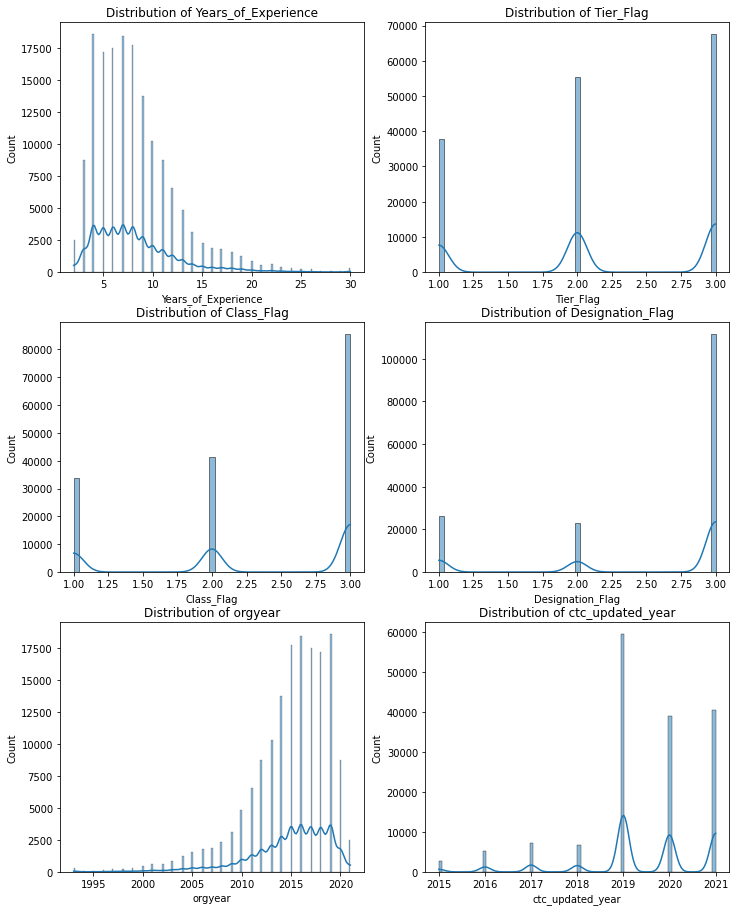

In [109]:
fig, axis = plt.subplots(nrows=3, ncols=2, figsize=(12, 8))
fig.subplots_adjust(top=1.6)

sns.histplot(data=df_new, x="Years_of_Experience", kde=True, ax=axis[0,0])
axis[0,0].set_title('Distribution of Years_of_Experience')
sns.histplot(data=df_new, x="Tier_Flag", kde=True, ax=axis[0,1])
axis[0,1].set_title('Distribution of Tier_Flag')
sns.histplot(data=df_new, x="Class_Flag", kde=True, ax=axis[1,0])
axis[1,0].set_title('Distribution of Class_Flag')
sns.histplot(data=df_new, x="Designation_Flag", kde=True, ax=axis[1,1])
axis[1,1].set_title('Distribution of Designation_Flag')
sns.histplot(data=df_new, x="orgyear", kde=True, ax=axis[2,0])
axis[2,0].set_title('Distribution of orgyear')
sns.histplot(data=df_new, x="ctc_updated_year", kde=True, ax=axis[2,1])
axis[2,1].set_title('Distribution of ctc_updated_year')
plt.show()

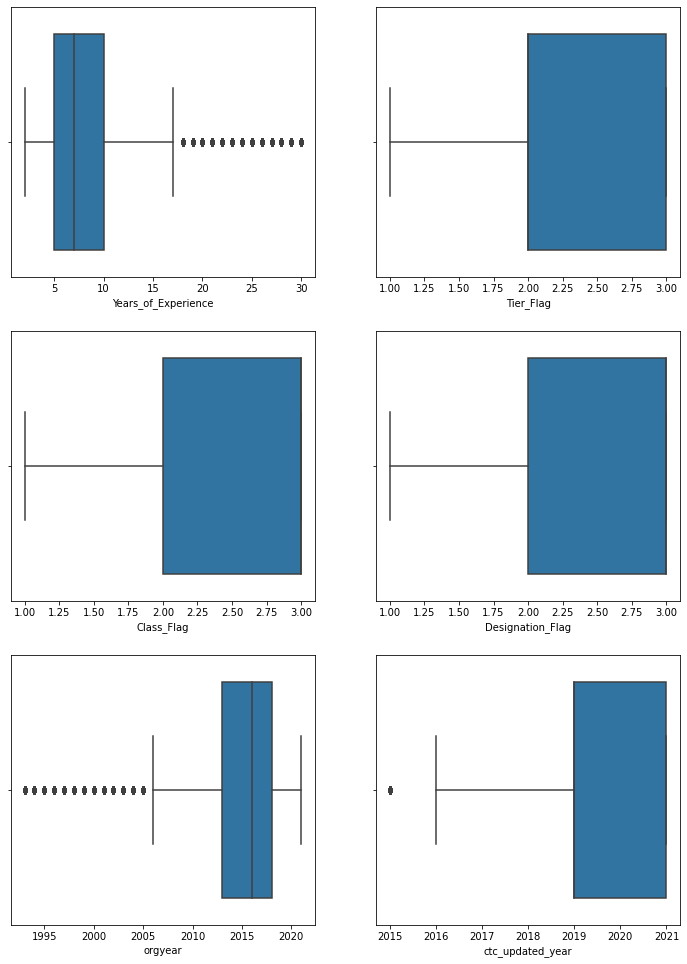

In [114]:
fig, axis = plt.subplots(nrows=3, ncols=2, figsize=(12, 10))
fig.subplots_adjust(top=1.4)

sns.boxplot(data=df_new, x="Years_of_Experience", ax=axis[0,0])
sns.boxplot(data=df_new, x="Tier_Flag", ax=axis[0,1])
sns.boxplot(data=df_new, x="Class_Flag", ax=axis[1,0])
sns.boxplot(data=df_new, x="Designation_Flag", ax=axis[1,1])
sns.boxplot(data=df_new, x="orgyear", ax=axis[2,0])
sns.boxplot(data=df_new, x="ctc_updated_year", ax=axis[2,1])
plt.show()

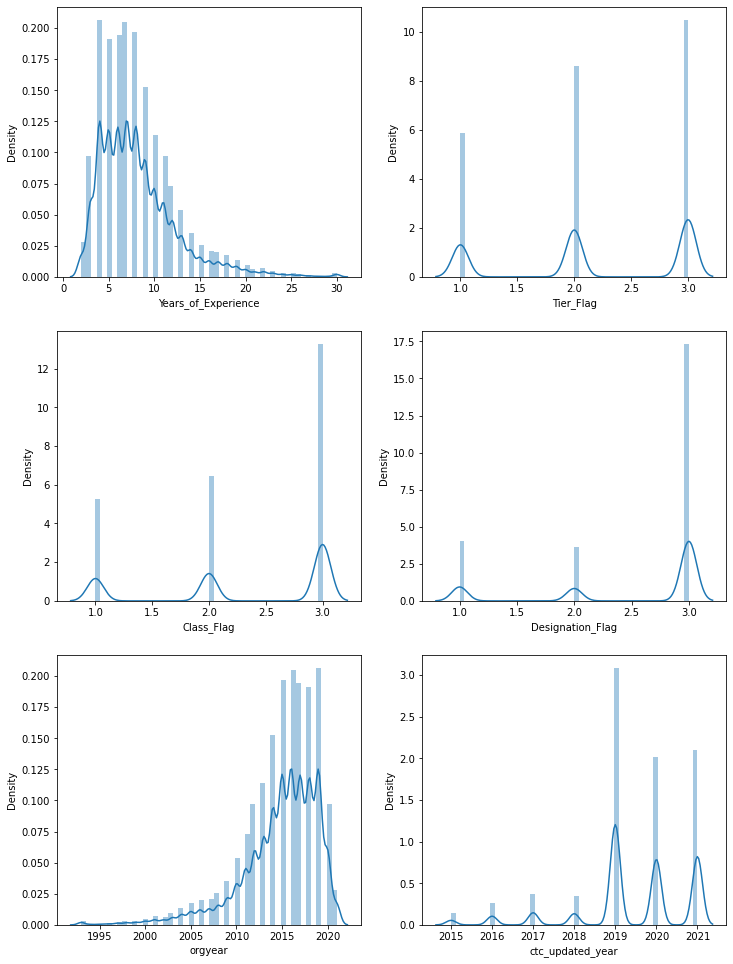

In [115]:
fig, axis = plt.subplots(nrows=3, ncols=2, figsize=(12, 10))
fig.subplots_adjust(top=1.4)

sns.distplot(df_new['Years_of_Experience'], ax=axis[0,0])
sns.distplot(df_new['Tier_Flag'], ax=axis[0,1])
sns.distplot(df_new['Class_Flag'], ax=axis[1,0])
sns.distplot(df_new['Designation_Flag'], ax=axis[1,1])
sns.distplot(df_new['orgyear'], ax=axis[2,0])
sns.distplot(df_new['ctc_updated_year'], ax=axis[2,1])
plt.show()

# Observations:

*  Majority of learners had 3-8 years of experience.
*  Majority of learners got their ctc updated in Year 2019.
*  Majority of learners lie in Tier 3 or Class 3 or Designation 3 class.
*  Some Outliers are present in Years of experiecnce column.

# Bivariate and Multivariate Analysis

<AxesSubplot:xlabel='Designation_Flag', ylabel='Years_of_Experience'>

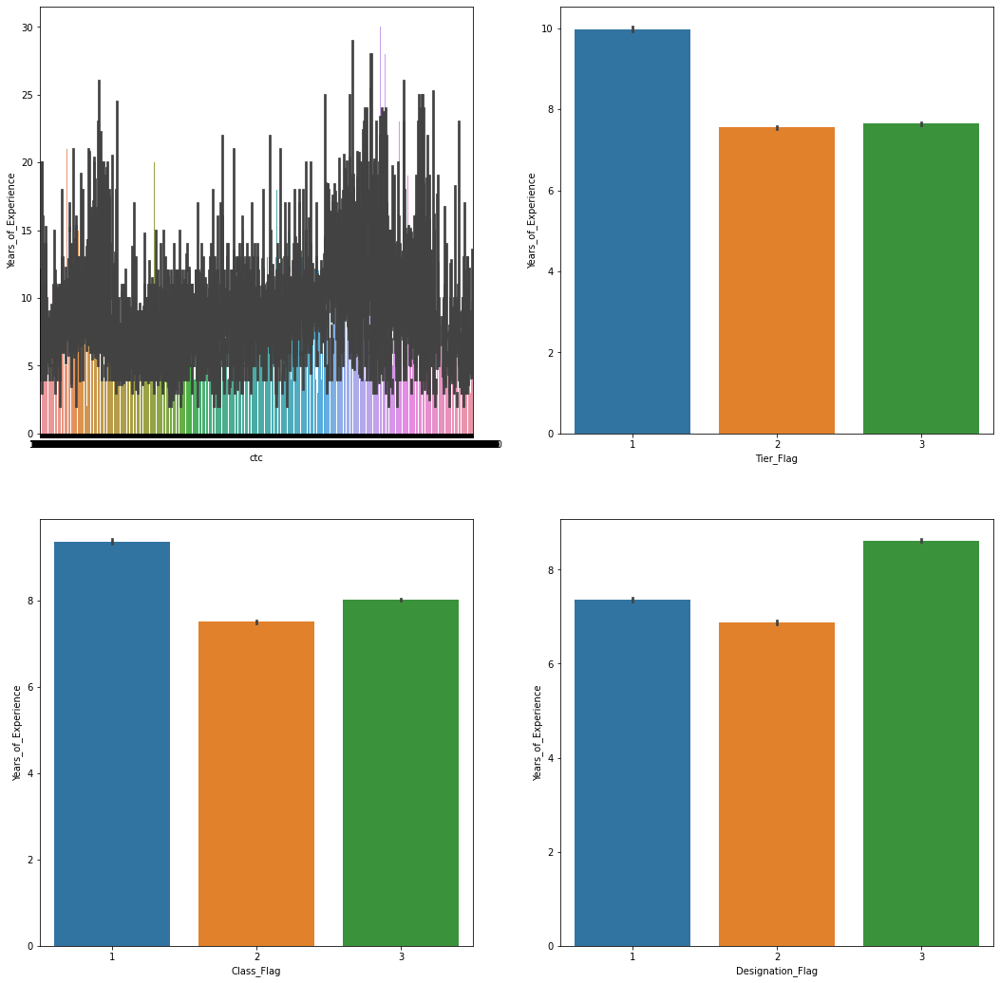

In [117]:
fig, axis = plt.subplots(nrows=2, ncols=2, figsize=(18, 10))
fig.subplots_adjust(top=1.5)

sns.barplot(x='ctc', y='Years_of_Experience', data=df_new, ax=axis[0,0])
sns.barplot(x='Tier_Flag', y='Years_of_Experience', data=df_new, ax=axis[0,1])
sns.barplot(x='Class_Flag', y='Years_of_Experience', data=df_new, ax=axis[1,0])
sns.barplot(x='Designation_Flag', y='Years_of_Experience', data=df_new, ax=axis[1,1])

<AxesSubplot:xlabel='Years_of_Experience', ylabel='Designation_Flag'>

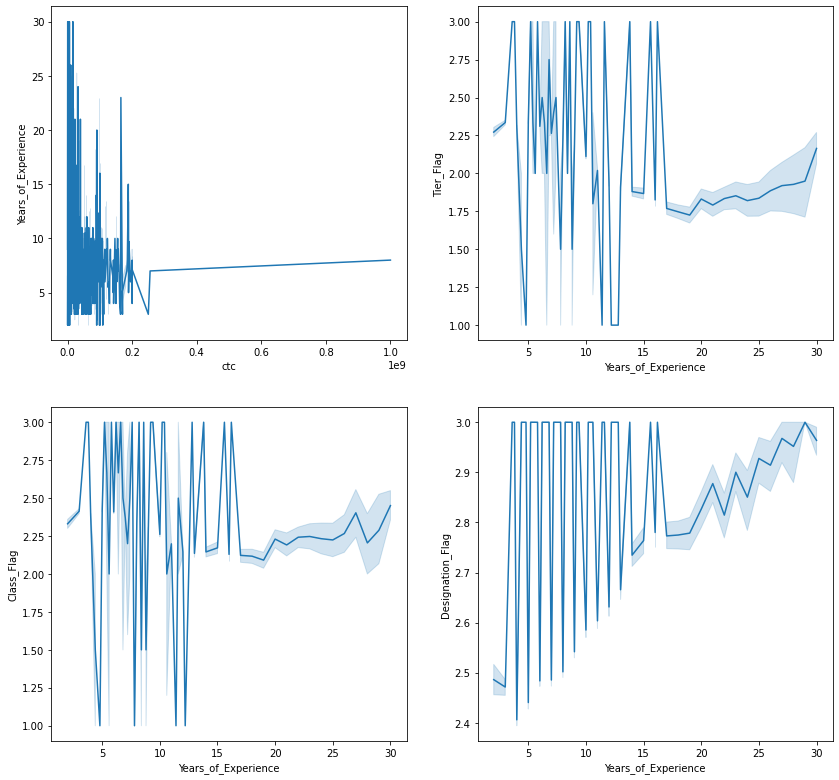

In [118]:
fig, axis = plt.subplots(nrows=2, ncols=2, figsize=(14, 8))
fig.subplots_adjust(top=1.4)

sns.lineplot(x='ctc', y='Years_of_Experience', data=df_new, ax=axis[0,0])
sns.lineplot(x='Years_of_Experience',y='Tier_Flag', data=df_new, ax=axis[0,1])
sns.lineplot(x='Years_of_Experience',y='Class_Flag', data=df_new, ax=axis[1,0])
sns.lineplot(x='Years_of_Experience',y='Designation_Flag', data=df_new, ax=axis[1,1])

<AxesSubplot:xlabel='Years_of_Experience', ylabel='Designation_Flag'>

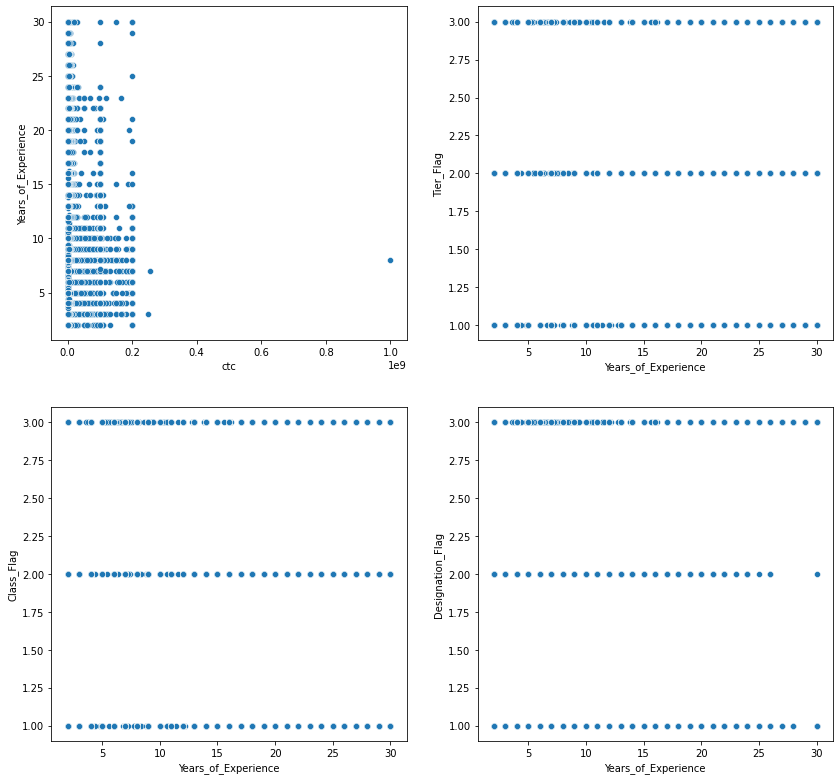

In [119]:
fig, axis = plt.subplots(nrows=2, ncols=2, figsize=(14, 8))
fig.subplots_adjust(top=1.4)

sns.scatterplot(x='ctc', y='Years_of_Experience', data=df_new, ax=axis[0,0])
sns.scatterplot(x='Years_of_Experience',y='Tier_Flag', data=df_new, ax=axis[0,1])
sns.scatterplot(x='Years_of_Experience',y='Class_Flag', data=df_new, ax=axis[1,0])
sns.scatterplot(x='Years_of_Experience',y='Designation_Flag', data=df_new, ax=axis[1,1])

<AxesSubplot:xlabel='job_position', ylabel='Years_of_Experience'>

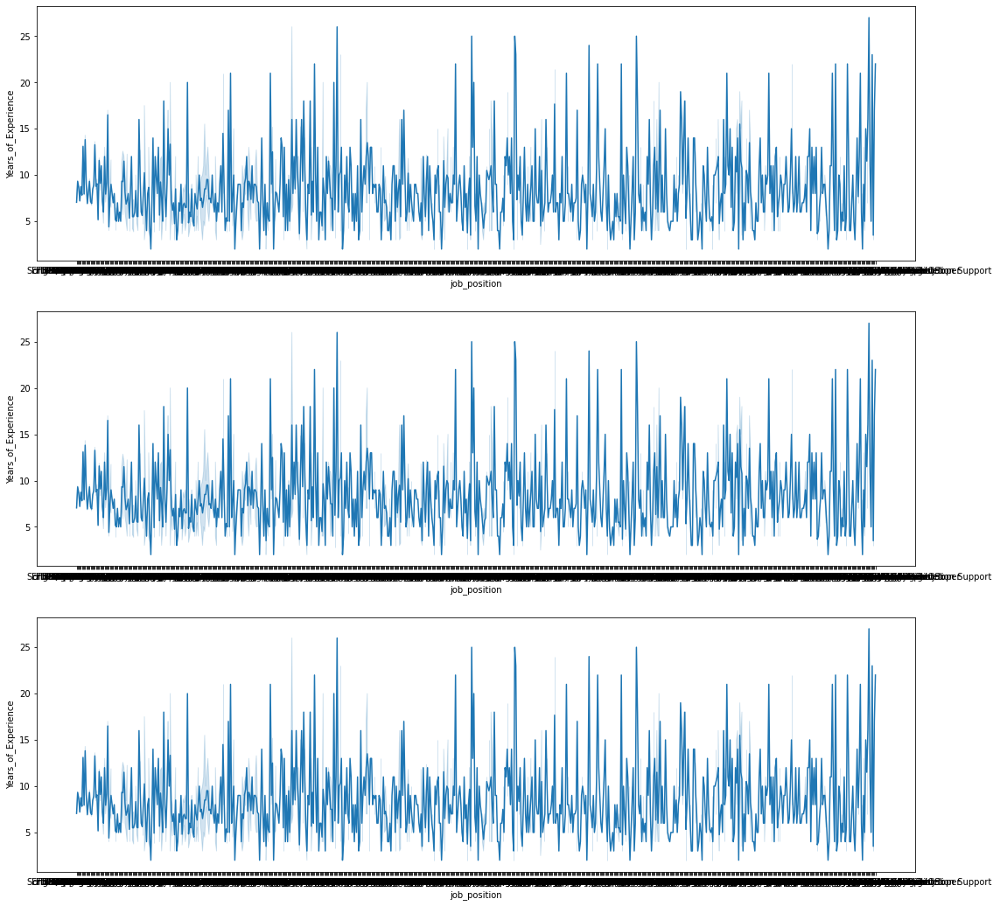

In [120]:
fig, axis = plt.subplots(nrows=3, figsize=(18, 10))
fig.subplots_adjust(top=1.5)

sns.lineplot(x='job_position', y='Years_of_Experience', data=df_new, ax=axis[0])
sns.lineplot(x='job_position', y='Years_of_Experience', data=df_new, ax=axis[1])
sns.lineplot(x='job_position', y='Years_of_Experience', data=df_new, ax=axis[2])

<AxesSubplot:xlabel='job_position', ylabel='Years_of_Experience'>

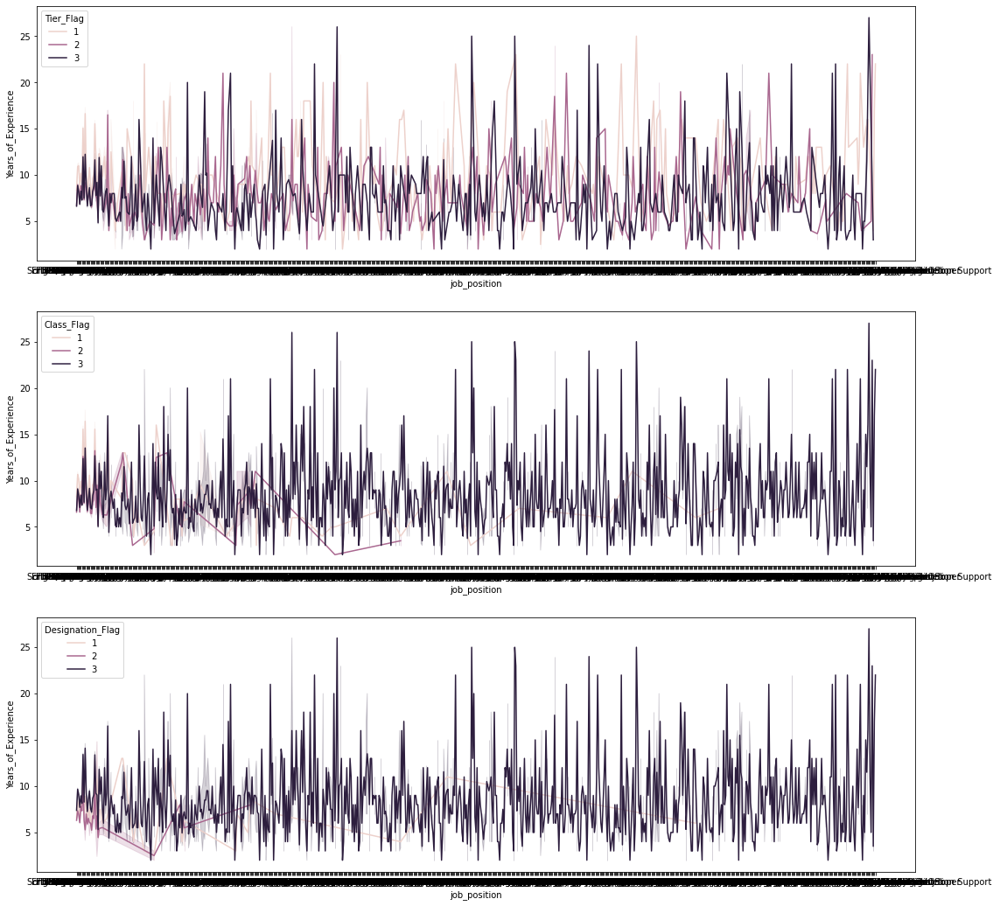

In [121]:
fig, axis = plt.subplots(nrows=3, figsize=(18, 10))
fig.subplots_adjust(top=1.5)

sns.lineplot(x='job_position', y='Years_of_Experience',hue='Tier_Flag', data=df_new, ax=axis[0])
sns.lineplot(x='job_position', y='Years_of_Experience',hue='Class_Flag', data=df_new, ax=axis[1])
sns.lineplot(x='job_position', y='Years_of_Experience',hue='Designation_Flag', data=df_new, ax=axis[2])

<AxesSubplot:xlabel='job_position', ylabel='Years_of_Experience'>

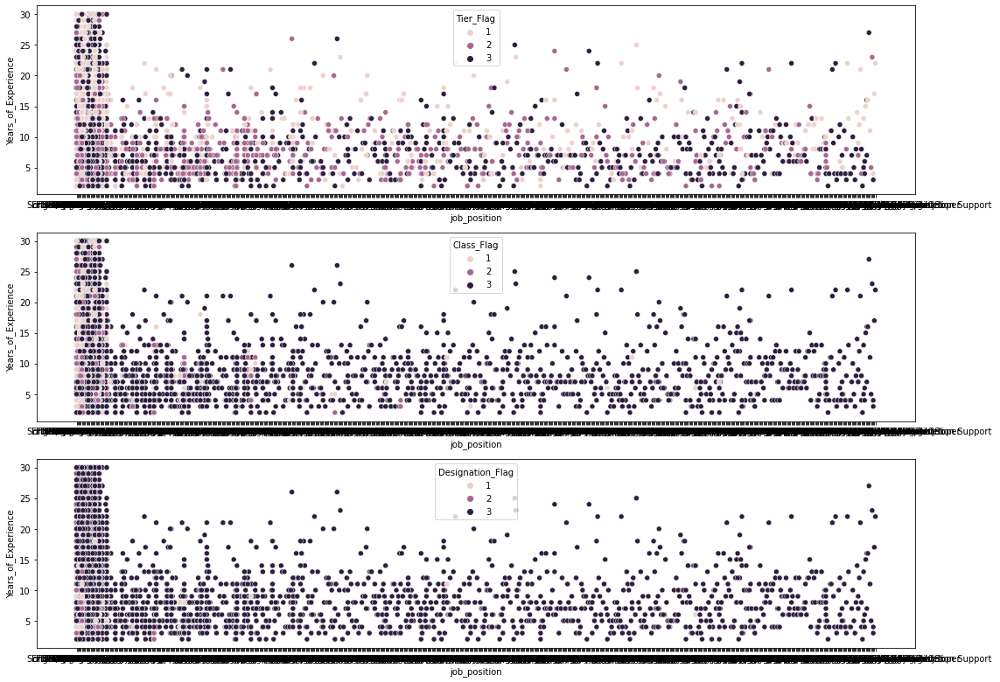

In [123]:
fig, axis = plt.subplots(nrows=3, figsize=(18, 8))
fig.subplots_adjust(top=1.4)

sns.scatterplot(x='job_position', y='Years_of_Experience',hue='Tier_Flag', data=df_new, ax=axis[0])
sns.scatterplot(x='job_position', y='Years_of_Experience',hue='Class_Flag', data=df_new, ax=axis[1])
sns.scatterplot(x='job_position', y='Years_of_Experience',hue='Designation_Flag', data=df_new, ax=axis[2])

In [128]:
## correlation matrix for heat map
df_new.corr()

,Years_of_Experience,ctc,orgyear,ctc_updated_year,Designation_Q1,Designation_Q3,Designation_Flag,Class_Q1,Class_Q3,Class_Flag,Tier_Q1,Tier_Q3,Tier_Flag
Years_of_Experience,1.000000,0.018959,-1.000000,-0.248479,0.041659,0.031965,0.138402,0.025916,0.025717,-0.097893,0.016472,0.018854,-0.192104
ctc,0.018959,1.000000,-0.018959,0.029685,0.797303,0.811041,-0.060098,0.687551,0.699541,-0.087538,0.581841,0.590502,-0.112223
orgyear,-1.000000,-0.018959,1.000000,0.248479,-0.041659,-0.031965,-0.138402,-0.025916,-0.025717,0.097893,-0.016472,-0.018854,0.192104
ctc_updated_year,-0.248479,0.029685,0.248479,1.000000,0.017649,0.019898,-0.094090,0.014070,0.011967,-0.050171,0.011965,0.006255,-0.037500
Designation_Q1,0.041659,0.797303,-0.041659,0.017649,1.000000,0.939153,0.048771,0.874467,0.879324,-0.012633,0.741326,0.748789,-0.053512
Designation_Q3,0.031965,0.811041,-0.031965,0.019898,0.939153,1.000000,0.013236,0.798613,0.819190,-0.037406,0.674493,0.686985,-0.069078
Designation_Flag,0.138402,-0.060098,-0.138402,-0.094090,0.048771,0.013236,1.000000,0.046970,0.030743,0.572066,0.037138,0.026578,0.422055
Class_Q1,0.025916,0.687551,-0.025916,0.014070,0.874467,0.798613,0.046970,1.000000,0.945036,0.053753,0.857598,0.857367,-0.002963
Class_Q3,0.025717,0.699541,-0.025717,0.011967,0.879324,0.819190,0.030743,0.945036,1.000000,0.021205,0.788788,0.809565,-0.026929
Class_Flag,-0.097893,-0.087538,0.097893,-0.050171,-0.012633,-0.037406,0.572066,0.053753,0.021205,1.000000,0.047750,0.029945,0.693868


<AxesSubplot:>

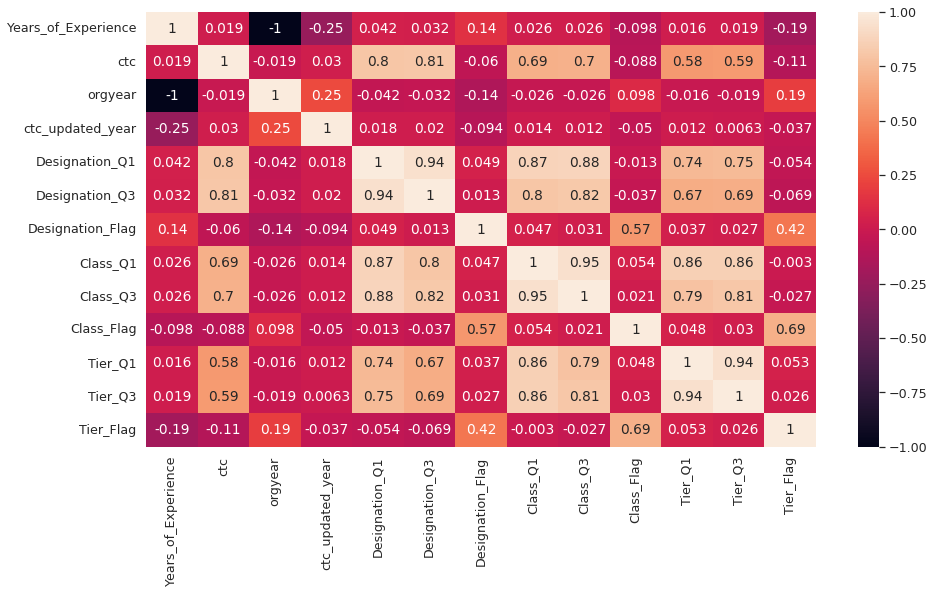

In [129]:
sns.set(font_scale=1.15)
plt.figure(figsize=(15,8))
sns.heatmap(df_new.corr(),annot=True, vmin=-1, vmax=1)

In [130]:
## spearman correlation matrix for heat map, used for better understanding 
df_new.corr('spearman')

,Years_of_Experience,ctc,orgyear,ctc_updated_year,Designation_Q1,Designation_Q3,Designation_Flag,Class_Q1,Class_Q3,Class_Flag,Tier_Q1,Tier_Q3,Tier_Flag
Years_of_Experience,1.000000,0.337006,-1.000000,-0.325007,0.409839,0.323866,0.139135,0.307046,0.235318,-0.092308,0.258190,0.199804,-0.179472
ctc,0.337006,1.000000,-0.337006,-0.085417,0.865899,0.856923,-0.235782,0.743310,0.741904,-0.445505,0.645613,0.652900,-0.576295
orgyear,-1.000000,-0.337006,1.000000,0.325007,-0.409839,-0.323866,-0.139135,-0.307046,-0.235318,0.092308,-0.258190,-0.199804,0.179472
ctc_updated_year,-0.325007,-0.085417,0.325007,1.000000,-0.148582,-0.114598,-0.106542,-0.171333,-0.121001,-0.055950,-0.178149,-0.145415,-0.035324
Designation_Q1,0.409839,0.865899,-0.409839,-0.148582,1.000000,0.878952,0.096893,0.856770,0.763133,-0.215760,0.749253,0.685538,-0.382443
Designation_Q3,0.323866,0.856923,-0.323866,-0.114598,0.878952,1.000000,-0.133344,0.748537,0.854372,-0.338908,0.654956,0.747485,-0.449585
Designation_Flag,0.139135,-0.235782,-0.139135,-0.106542,0.096893,-0.133344,1.000000,0.104229,-0.124089,0.583974,0.072180,-0.091060,0.420546
Class_Q1,0.307046,0.743310,-0.307046,-0.171333,0.856770,0.748537,0.104229,1.000000,0.797105,0.037296,0.860102,0.727003,-0.186744
Class_Q3,0.235318,0.741904,-0.235318,-0.121001,0.763133,0.854372,-0.124089,0.797105,1.000000,-0.201956,0.701347,0.859889,-0.313460
Class_Flag,-0.092308,-0.445505,0.092308,-0.055950,-0.215760,-0.338908,0.583974,0.037296,-0.201956,1.000000,0.024089,-0.167608,0.695350


<AxesSubplot:>

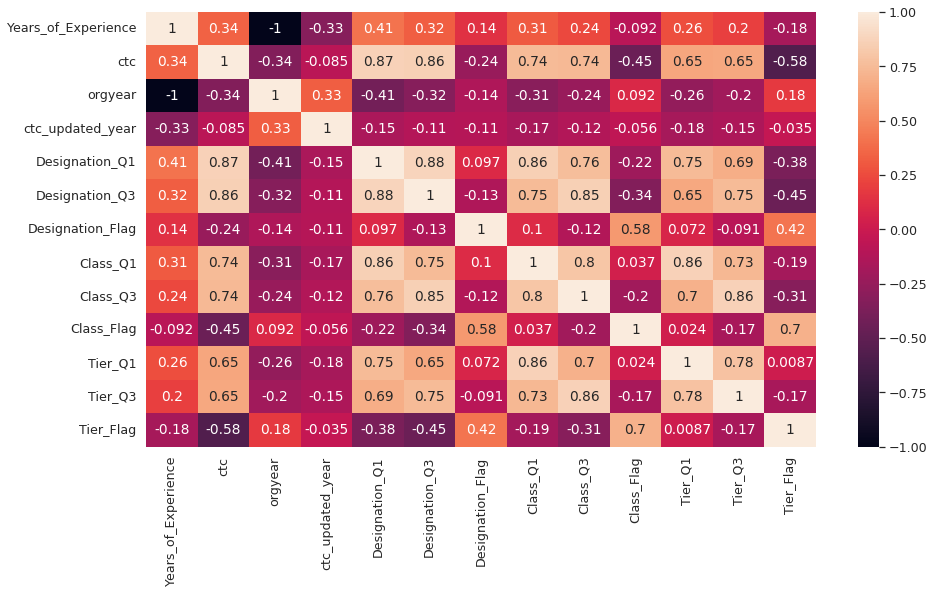

In [131]:
sns.set(font_scale=1.15)
plt.figure(figsize=(15,8))
sns.heatmap(df_new.corr('spearman'),annot=True,vmin=-1, vmax=1)

# Observations:

*  There is a positive correlation between Years of experience of learners and CTC.
*  class,tier and Designation Quartiles have positive Correlation with CTC.
*  By increase in Years of experience of learners then their Designation is also tends to Increase

# Data PrePocessing for Building Model

In [132]:
from sklearn import preprocessing
  
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
  
# Encode labels in column 'species'.
df_new['company_hash']= label_encoder.fit_transform(df_new['company_hash'])
df_new['job_position']= label_encoder.fit_transform(df_new['job_position'])
df_new['email_hash']= label_encoder.fit_transform(df_new['email_hash'])

In [134]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 160844 entries, 0 to 160843
Data columns (total 16 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   email_hash           160844 non-null  int64  
 1   company_hash         160844 non-null  int64  
 2   Years_of_Experience  160844 non-null  float64
 3   job_position         160844 non-null  int64  
 4   ctc                  160844 non-null  int64  
 5   orgyear              160844 non-null  float64
 6   ctc_updated_year     160844 non-null  float64
 7   Designation_Q1       160844 non-null  float64
 8   Designation_Q3       160844 non-null  float64
 9   Designation_Flag     160844 non-null  int64  
 10  Class_Q1             160844 non-null  float64
 11  Class_Q3             160844 non-null  float64
 12  Class_Flag           160844 non-null  int64  
 13  Tier_Q1              160844 non-null  float64
 14  Tier_Q3              160844 non-null  float64
 15  Tier_Flag        

In [136]:
df_new.columns

Index(['email_hash', 'company_hash', 'Years_of_Experience', 'job_position',
       'ctc', 'orgyear', 'ctc_updated_year', 'Designation_Q1',
       'Designation_Q3', 'Designation_Flag', 'Class_Q1', 'Class_Q3',
       'Class_Flag', 'Tier_Q1', 'Tier_Q3', 'Tier_Flag'],
      dtype='object')

In [135]:
df1=df_new.copy()

In [137]:
df1.drop(['Designation_Q1','Designation_Q3', 'Class_Q1', 'Class_Q3','Tier_Q1', 'Tier_Q3'], axis=1, inplace=True)

In [139]:
X=df1.copy()

In [140]:
#Standardization
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)
X=scaler.transform(X)

# Building K-Means Clustering Model

In [154]:
from pyclustertend import hopkins
hopkins(X,X.shape[0])

0.07502445059075677

*  After checking Hopkins Clustering Tendency Test
we got 0.07 which is small than 0.5
*  This means data is uniformly Distributed but we proceed to check the clustering algorithms.

In [158]:
from sklearn.cluster import KMeans

k = 4
kmeans = KMeans(n_clusters=k)
kmeans.fit(X)
labels = kmeans.predict(X)

In [156]:
kmeans.inertia_

63921.41693096972

In [159]:
clusters = pd.DataFrame(X, columns=df1.columns)
clusters['label'] = kmeans.labels_
clusters.head(3)

,email_hash,company_hash,Years_of_Experience,job_position,ctc,orgyear,ctc_updated_year,Designation_Flag,Class_Flag,Tier_Flag,label
0,1.000000,0.576787,0.107143,0.300539,0.0015,0.892857,1.000000,1.0,1.0,1.0,0
1,0.999993,0.993887,0.035714,0.300539,0.0007,0.964286,0.833333,1.0,1.0,1.0,0
2,0.999987,0.972251,0.250000,0.239892,0.0009,0.750000,0.666667,0.0,0.0,0.5,2


In [160]:
import plotly.express as px

fig = px.scatter_3d(clusters, x='job_position', y='Years_of_Experience',z='Tier_Flag', color='label', width=600, height=600)
fig.update_traces(marker=dict(size=2), selector=dict(mode='markers'))
fig.show()

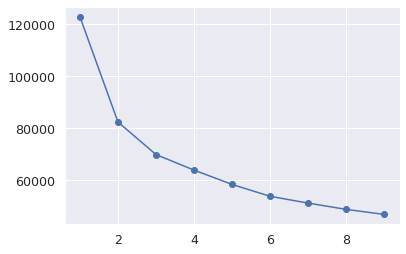

In [161]:
#Elbow_method to find Best K
wcss = []
for k in range(1, 10):
    model = KMeans(n_clusters = k)
    model.fit(X)
    wcss.append(model.inertia_)
plt.plot(range(1, 10), wcss, '-o')

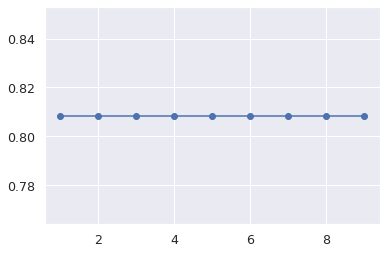

In [194]:
# DB index over Different K values
from sklearn.metrics import davies_bouldin_score
DB_index = []
for k in range(1, 10):
    model = KMeans(n_clusters = k)
    model.fit(X)
    labels = kmeans.predict(X)
    score=davies_bouldin_score(X, labels)
    DB_index.append(score)

plt.plot(range(1, 10), DB_index, '-o')

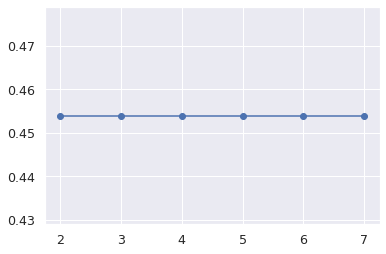

In [196]:
# silhouette_score over Different K values
from sklearn.metrics import silhouette_score
silhouette_score_list = []
for k in range(2, 8):
    model = KMeans(n_clusters = k)
    model.fit(X)
    labels = kmeans.predict(X)
    score=silhouette_score(X, labels)
    silhouette_score_list.append(score)

plt.plot(range(2, 8), silhouette_score_list, '-o')

In [162]:
from sklearn.cluster import KMeans

k = 3
kmeans = KMeans(n_clusters=k)
kmeans.fit(X)
labels = kmeans.predict(X)

In [163]:
kmeans.inertia_

69902.64966870387

In [164]:
clusters = pd.DataFrame(X, columns=df1.columns)
clusters['label'] = kmeans.labels_
clusters.head(3)

,email_hash,company_hash,Years_of_Experience,job_position,ctc,orgyear,ctc_updated_year,Designation_Flag,Class_Flag,Tier_Flag,label
0,1.000000,0.576787,0.107143,0.300539,0.0015,0.892857,1.000000,1.0,1.0,1.0,0
1,0.999993,0.993887,0.035714,0.300539,0.0007,0.964286,0.833333,1.0,1.0,1.0,0
2,0.999987,0.972251,0.250000,0.239892,0.0009,0.750000,0.666667,0.0,0.0,0.5,2


In [165]:
import plotly.express as px

fig = px.scatter_3d(clusters, x='job_position', y='Years_of_Experience',z='Tier_Flag', color='label', width=600, height=600)
fig.update_traces(marker=dict(size=2), selector=dict(mode='markers'))
fig.show()

# Building Hierarchial Clustering Model

Taking a sample of Data to Load the Hierarchial Model

In [166]:
df2=df1.sample(5000)

In [167]:
X=df2

In [168]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

In [169]:
scaled_df = pd.DataFrame(X, columns=df2.columns, index=df2.index)

In [170]:
import scipy.cluster.hierarchy as sch

Z = sch.linkage(scaled_df, method='ward', metric='euclidean')

Text(0, 0.5, 'distance')

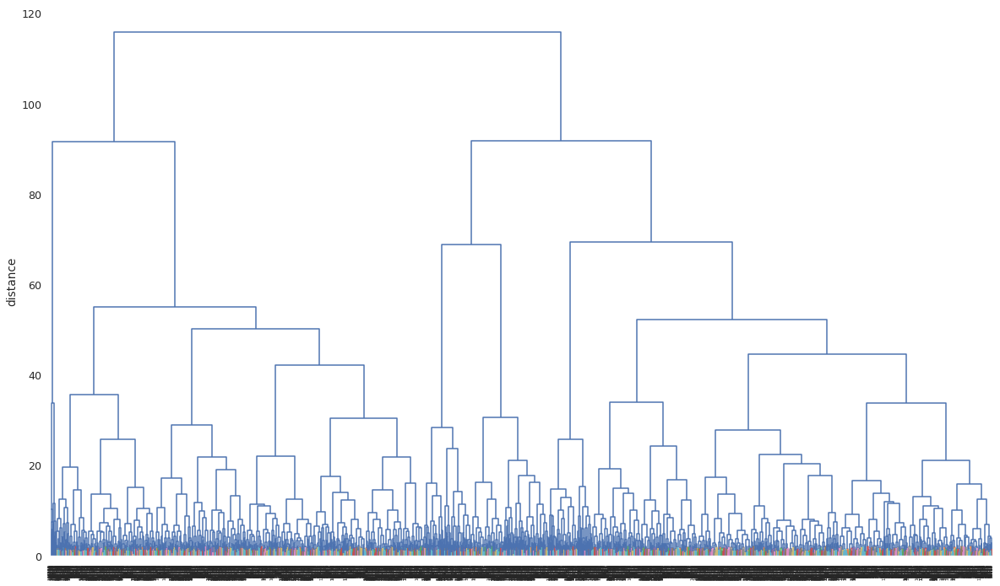

In [171]:
fig, ax = plt.subplots(figsize=(20, 12))
sch.dendrogram(Z, labels=scaled_df.index, ax=ax, color_threshold=2)
plt.xticks(rotation=90)
ax.set_ylabel('distance')

In [173]:
from sklearn.cluster import AgglomerativeClustering

hc = AgglomerativeClustering(n_clusters = 4, affinity='euclidean', linkage='ward')
hc.fit(X)

AgglomerativeClustering(affinity='euclidean', n_clusters=4)

In [174]:
clusters = pd.DataFrame(X, columns=df2.columns)
clusters['label'] = hc.labels_
clusters.head(3)

,email_hash,company_hash,Years_of_Experience,job_position,ctc,orgyear,ctc_updated_year,Designation_Flag,Class_Flag,Tier_Flag,label
0,-1.045943,-1.111113,0.696115,1.394619,0.078566,-0.696115,0.379147,0.624091,-1.638599,-0.240406,1
1,1.109621,1.420778,-0.493483,-0.040190,-0.166103,0.493483,-0.368383,0.624091,0.858124,1.032932,0
2,0.728204,-1.095273,-0.731403,-1.439129,-0.159579,0.731403,0.379147,-0.692001,0.858124,1.032932,0


In [178]:
fig = px.scatter_3d(clusters, x='job_position', y='Years_of_Experience',z='company_hash', color='label', width=600, height=600)
fig.update_traces(marker=dict(size=2), selector=dict(mode='markers'))
fig.show()


# Observations:

* No Proper Clusters are Formed by K-means and Hierarchial may be we have to use advance Techiniques like GMM and DBSCAN.
* Also we can see by Hopkins Test that clusters are not possible as H-value is less than 0.5
* with Elbow method we came to know that 3 is the best value for K
---



# Actionable Insights:

* Some Duplicates are found Removed them.
* Some missing values are present in provided Dataset imputed them.
* Total of 153443 Learners are present in provided Dataset.
* Total of 111551 learners are in Designation 3 type which is most.
* Total of 85478 learners are in class 3 type which is most.
* Total of 67545 learners are in Tier 3 type which is most.
* Top 2 Positions are Not same For all Companies.
* Top 2 Positions Differ from Company to company.
* Majority of learners had 3-8 years of experience.
* Majority of learners got their ctc updated in Year 2019.
* There is a positive correlation between Years of experience of learners and CTC.
* class,tier and Designation Quartiles have positive Correlation with CTC.
* By increase in Years of experience of learners then their Designation is also tends to Increase
* No Proper Clusters are Formed by K-means and Hierarchial, may be we have to use advance Techiniques like GMM and DBSCAN.
* Also we can see by Hopkins Test that clusters are not possible as H-value is less than 0.5
* with Elbow method we came to know that 3 is the best value for K




# Recommendations:

* Company should Focus more on more Experience Guy like 2 to 6 years.
* Company should Focus Learners with better Tier and Designation in their Respective Companies.
* Company should Focus Learners who shows Interest in Data Science as Data Science role candiates are very less in Companies.
* Company should Focus learners with High CTC so that they might show some interest in Course Offered.